In [1]:
%matplotlib notebook
import numpy as np
import re
import pandas as pd
import orbipy as op
import matplotlib.pyplot as plt
import pickle

In [2]:
model = op.crtbp3_model()
precise_model = op.crtbp3_model()
precise_model.integrator.set_params(max_step=np.pi/180)
stm_model = op.crtbp3_model(stm=True)
plotter = op.plotter.from_model(model, length_units='km', velocity_units='m/s')
scaler = plotter.scaler

In [3]:
class Hyperbolic:
    def __init__(self):
        self.c2 = self.calc_c2()
        self.lam = self.calc_lam()
        self.omega = self.calc_omega()
        self.k1 = self.calc_k1()
        self.k2 = self.calc_k2()
        self.k3 = self.calc_k3()
        self.k4 = self.calc_k4()
        
    def p1(self, state):
        (x, y) = state[:2]
        x -= model.L1
        (vx, vy) = state[3:5]
        
        return ((self.k3*self.omega*x-self.k1*vy)/(self.k1*self.k4*self.lam+self.k2*self.k3*self.omega) +\
                (self.k1*self.omega*y+self.k3*vx)/(self.k2*self.k3*self.lam-self.k1*self.k4*self.omega))/2
    
    def p1_table(self, orbit):
        x = orbit['x'].values - model.L1
        vx = orbit['vx'].values
        y = orbit['y'].values
        vy = orbit['vy'].values
        
        return ((self.k3*self.omega*x-self.k1*vy)/(self.k1*self.k4*self.lam+self.k2*self.k3*self.omega) +\
                (self.k1*self.omega*y+self.k3*vx)/(self.k2*self.k3*self.lam-self.k1*self.k4*self.omega))/2
    
    def p2_table(self, orbit):
        x = orbit['x'].values - model.L1
        vx = orbit['vx'].values
        y = orbit['y'].values
        vy = orbit['vy'].values
        
        return ((self.k3*self.omega*x-self.k1*vy)/(self.k1*self.k4*self.lam+self.k2*self.k3*self.omega) -\
                (self.k1*self.omega*y+self.k3*vx)/(self.k2*self.k3*self.lam-self.k1*self.k4*self.omega))/2
    
    def p2(self, state):
        (x, y) = state[:2]
        x -= model.L1
        (vx, vy) = state[3:5]
        
        return ((self.k3*self.omega*x-self.k1*vy)/(self.k1*self.k4*self.lam+self.k2*self.k3*self.omega) -\
                (self.k1*self.omega*y+self.k3*vx)/(self.k2*self.k3*self.lam-self.k1*self.k4*self.omega))/2
    
    def calc_vy(self, state):
        (x, y) = state[:2]
        x -= model.L1
        (vx, vy) = state[3:5]
        
        return (self.k3*self.omega*x+(self.k1*self.k4*self.lam+self.k2*self.k3*self.omega)*(self.k1*self.omega*y+self.k3*vx)/(self.k2*self.k3*self.lam-self.k1*self.k4*self.omega))/self.k1
        
    def calc_c2(self):
        r1 = np.abs(model.L1+model.mu)
        r2 = np.abs(model.L1+model.mu-1)
        
        return (1.-model.mu)/r1**3+model.mu/r2**3
    
    def calc_lam(self):
        return np.sqrt((self.c2-2+np.sqrt(9*self.c2**2-8*self.c2))/2)
    
    def calc_omega(self):
        return np.sqrt((-1.*self.c2+2+np.sqrt(9*self.c2**2-8*self.c2))/2)
        
    def calc_k1(self):
        return -2/(self.c2+3+self.lam**2)
    
    def calc_k2(self):
        return -2/(2*self.c2+1-self.lam**2)
    
    def calc_k3(self):
        return (self.omega*(self.c2-1+self.lam**2))/((self.c2-1)*(self.c2+3+self.lam**2))
    
    def calc_k4(self):
        return (self.lam*(-2*self.c2+3+self.lam**2))/((self.c2-1)*(-2*self.c2-1+self.lam**2))

In [4]:
class EventP1(op.base_event):
    def __call__(self, t, s):
        return hyp.p1(s) - self.value

In [5]:
x0 = model.L1 + scaler(1, 'km-nd')
z0 = scaler(1, 'km-nd')
s0 = model.get_zero_state()
s0[0] = x0
s0[2] = z0

In [6]:
EL1_dist = 1.-model.mu - model.L1
left = op.eventXleft = op.eventX(model.L1-EL1_dist)
right = op.eventX(1.-model.mu)

In [7]:
corr = op.border_correction(model, op.y_direction(), left, right)

In [8]:
sk = op.simple_station_keeping(precise_model,corr, corr)

In [9]:
orb = sk.prop(0.0, s0, 30)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


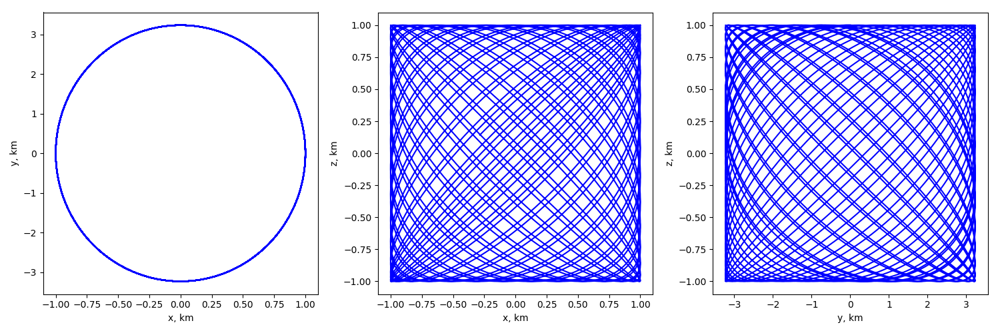

In [10]:
ax = plotter.plot_proj(orb, centers={'x': model.L1, 'y': 0.0, 'z': 0.0})

In [13]:
hyp = Hyperbolic()
states_data = orb.drop('t', axis=1)
orb_h1 = hyp.p1_table(states_data)

<IPython.core.display.Javascript object>


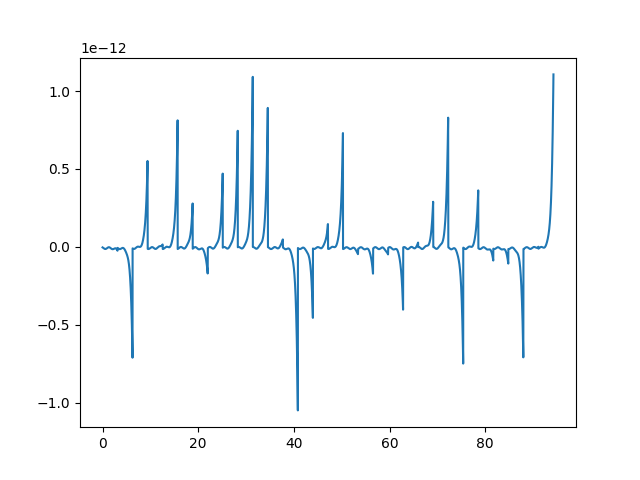

In [14]:
plt.plot(orb['t'], orb_h1)

In [31]:
def final_pos(s0, v_range, events):
    es = []
    traj = []
    det = op.event_detector(model, events)
    for v in v_range:
        s1 = s0.copy()
        s1[4] = v
        df, ev = det.prop(s1, 0.0, 10*np.pi)
        ev_happened = ev.iloc[0]['e']
        if len(es)>1:
            if ev_happened != es[-1]:
                traj.append(df)
        es.append(ev_happened)
    plt.plot(v_range, es)
#     plt.axvline(s0[4],c='r')
    return traj

In [25]:
p1_left = EventP1(value=0.0015, terminal=True)
p1_right = EventP1(value=-0.0015, terminal=True)

In [18]:
hyp.p1(s1+[0,0,0,0,-0.1,0])

0.012574659896408078

In [21]:
vys = np.linspace(s1[4]-dv,s1[4]+dv,1000)

In [22]:
new_states = [[x0,0,z0,0,vy,0] for vy in vys]

In [23]:
p1s = [hyp.p1(s) for s in new_states]

<IPython.core.display.Javascript object>


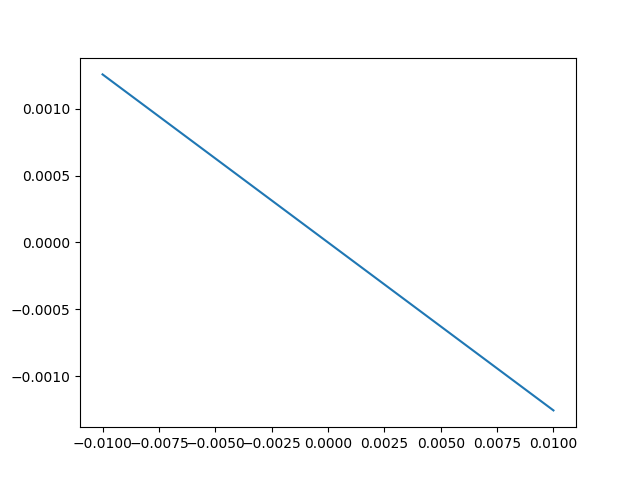

In [24]:
plt.plot(vys, p1s)

<IPython.core.display.Javascript object>


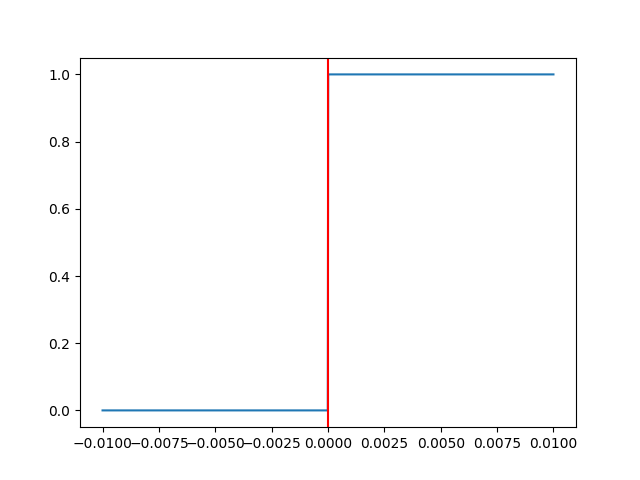

In [26]:
s1 = orb.iloc[0].values[1:]
dv = 0.01
tr = final_pos(s1, np.linspace(s1[4]-dv,s1[4]+dv,1000), [p1_left, p1_right])

In [27]:
corr = op.border_correction(model, op.y_direction(), p1_left, p1_right)

In [28]:
sk = op.simple_station_keeping(precise_model,corr, corr)

In [29]:
df2 = sk.prop(0.0, s1, N=10)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


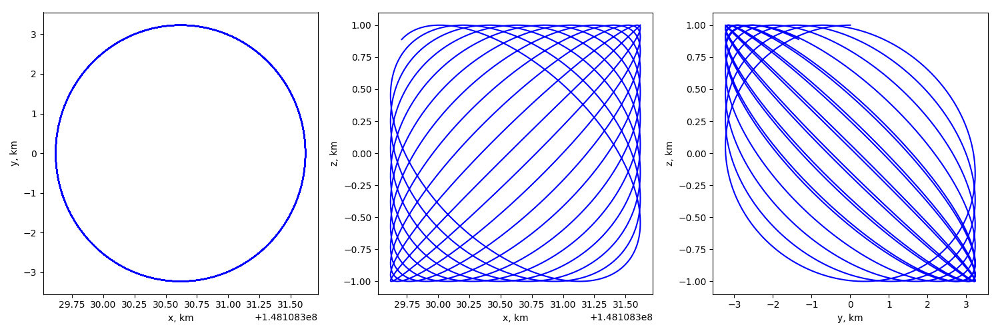

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f9ff2d32c50>,
      dtype=object)

In [30]:
plotter.plot_proj(df2)

In [162]:
class Experiment:
    def __init__(self, dx,dz):
        self.dx = dx
        self.dz = dz
        self.hyp = Hyperbolic()
        
    def calc_s0(self):
        s0 = model.get_zero_state()
        s0[0] = model.L1+self.dx
        s0[2] = self.dz
        return s0
        
    def calc_orb(self, plot=False):
        s0 = self.calc_s0()
        EL1_dist = 1.-model.mu - model.L1
        left = op.eventXleft = op.eventX(model.L1-EL1_dist)
        right = op.eventX(1.-model.mu)
        corr = op.border_correction(model, op.y_direction(), left, right)
        sk = op.simple_station_keeping(precise_model,corr, corr)
        orb = sk.prop(0.0, s0, 30)
        if plot:
            plotter.plot_proj(orb,centers={'x': model.L1})
        return orb
    
    def calc_h1_on_orb(self, plot=False):
        orb = self.calc_orb()
        states_data = orb.drop('t', axis=1)
        orb_h1 = self.hyp.p1_table(states_data)
        if plot:
            plt.plot(orb['t'], orb_h1)
        return orb_h1
    
    def calc_h1_with_dv(self, dv):
        s0 = self.calc_s0()
        s1 = s0.copy()
        s2 = s0.copy()
        s1[4] -= dv
        s2[4] += dv
        return self.hyp.p1(s1), self.hyp.p1(s2)
    
    def calc_final_pos(self, dv):
        left_val, right_val = self.calc_h1_with_dv(dv+0.00001)
        print(left_val)
        print(right_val)
        p1_left = EventP1(value=left_val, terminal=True)
        p1_right = EventP1(value=right_val, terminal=True)
        s1 = self.calc_s0()
        tr = final_pos(s1, np.linspace(s1[4]-dv,s1[4]+dv,1000), [p1_left, p1_right])
        return tr
    
    def calc_orb_with_p1(self, left_val, right_val,plot=False, override_s0=model.get_zero_state()):
        if override_s0.sum() == 0:
            s0 = self.calc_s0()
        s0 = override_s0.copy()
        p1_left = EventP1(value=left_val, terminal=True)
        p1_right = EventP1(value=right_val, terminal=True)
        corr = op.border_correction(model, op.y_direction(), p1_left, p1_right)
        sk = op.simple_station_keeping(precise_model,corr, corr)
        df2 = sk.prop(0.0, s0, N=30)
        if plot:
            plotter.plot_proj(df2,centers={'x': model.L1})
        return df2

# 1

In [138]:
exp = Experiment(1/model.R,1/model.R)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


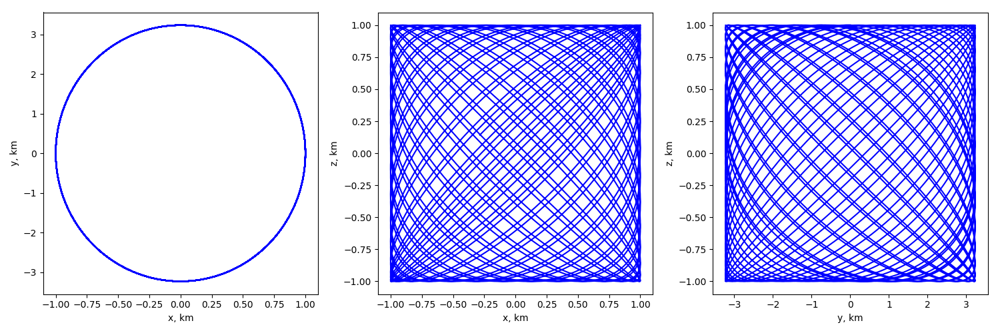

In [80]:
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


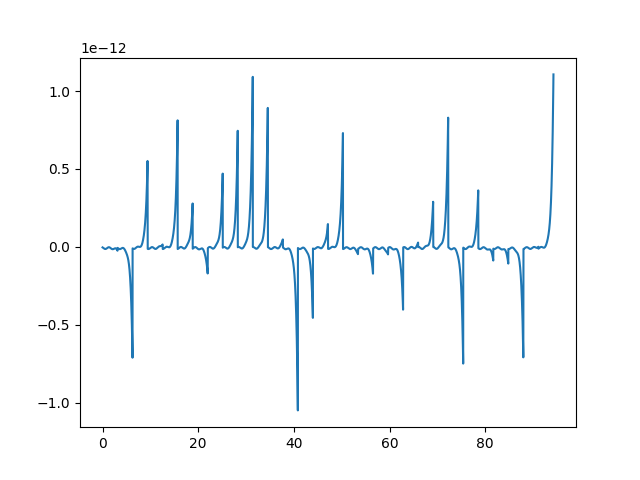

In [81]:
_ = exp.calc_h1_on_orb(True)

In [82]:
exp.calc_h1_with_dv(0.01)

(0.0012574603265746778, -0.0012574716527076761)

0.001258717792564319
-0.0012587291186973173


<IPython.core.display.Javascript object>


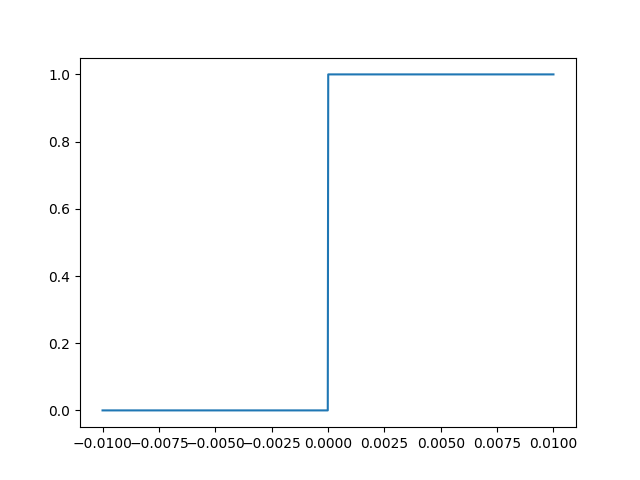

In [83]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


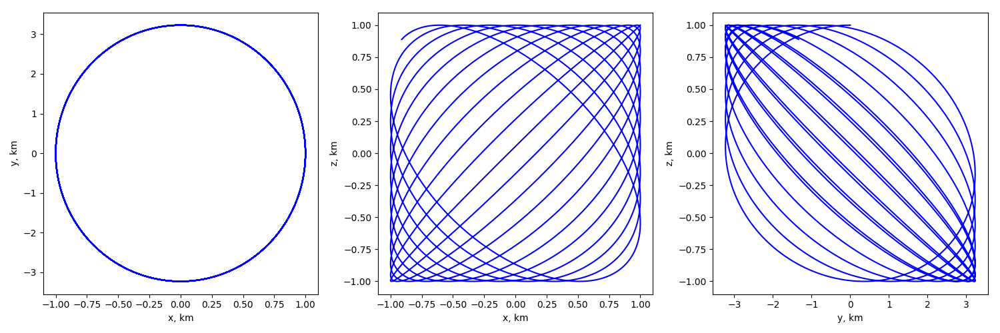

In [94]:
_=exp.calc_orb_with_p1(0.0012574603265746778, -0.0012574716527076761, True)

# 10

In [139]:
exp = Experiment(10/model.R,10/model.R)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


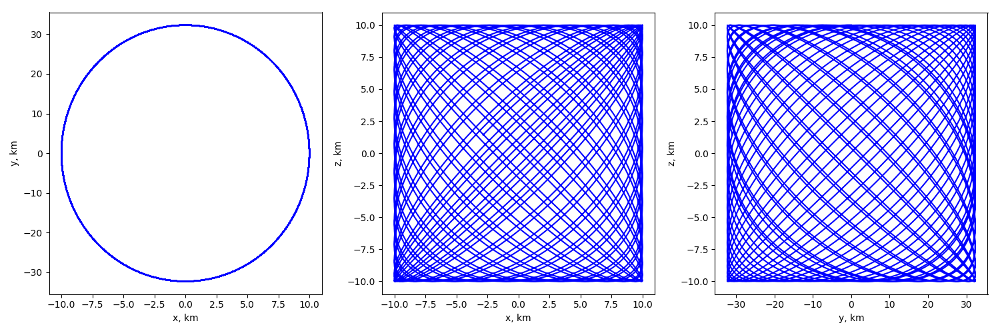

In [87]:
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


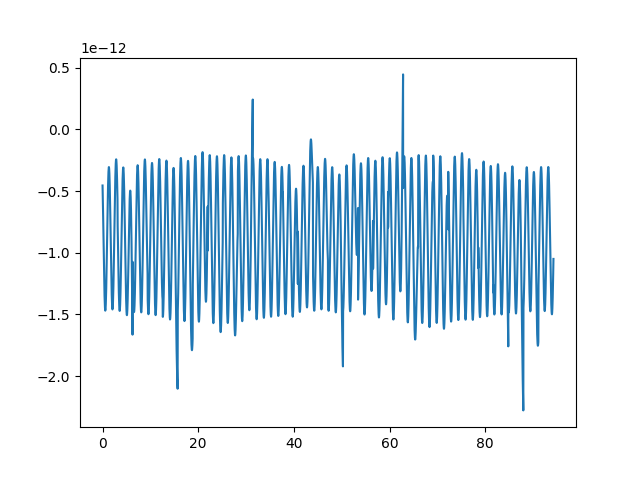

In [88]:
_ = exp.calc_h1_on_orb(True)

0.0012586668249656382
-0.001258780086295998


<IPython.core.display.Javascript object>


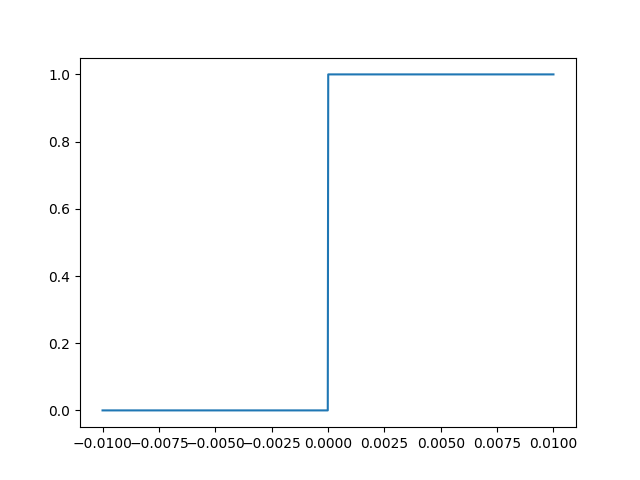

In [89]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


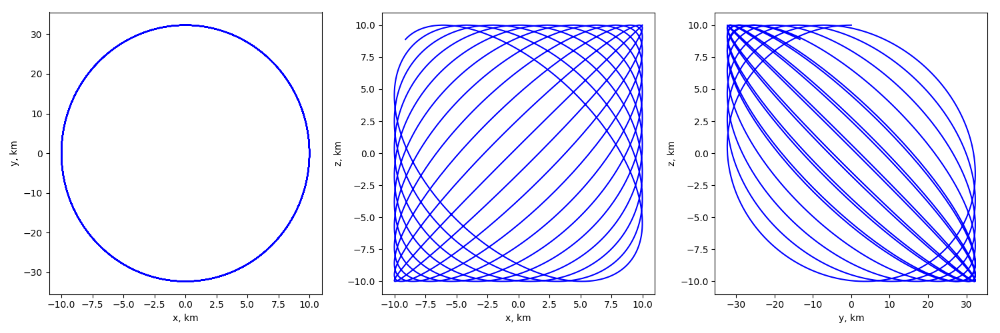

In [96]:
_=exp.calc_orb_with_p1(0.0012586668249656382, -0.001258780086295998, True)

# 50

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


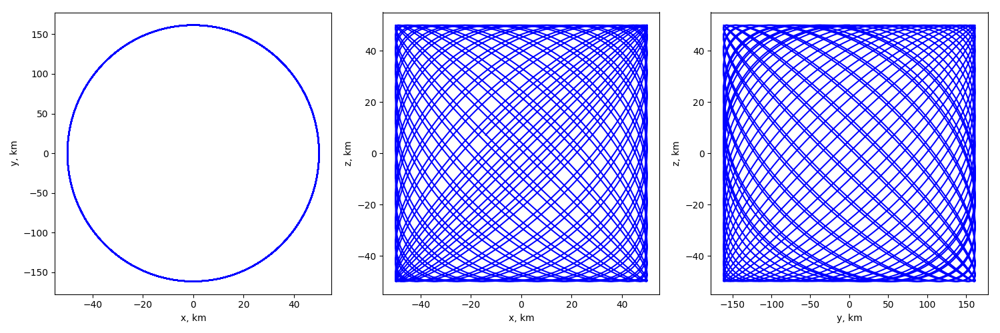

In [140]:
exp = Experiment(50/model.R,50/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


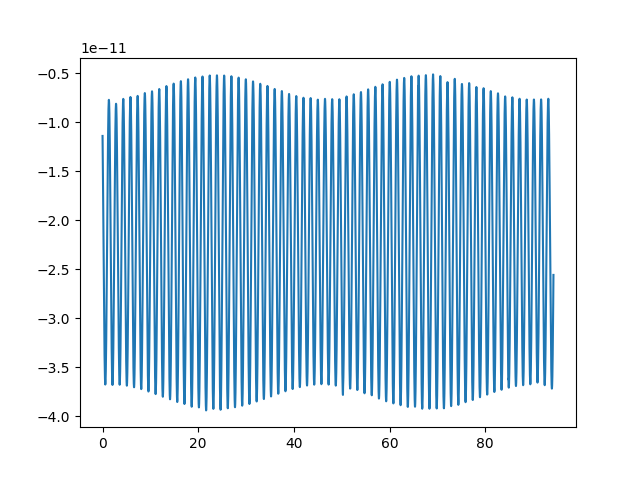

In [114]:
_ = exp.calc_h1_on_orb(True)

0.0012584403023051065
-0.0012590066089565295


<IPython.core.display.Javascript object>


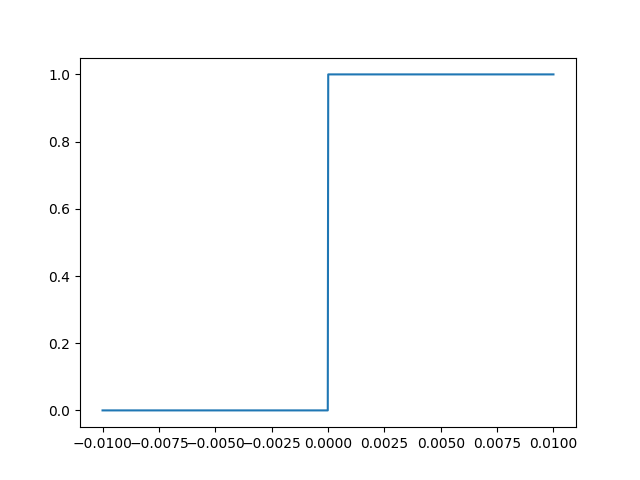

In [115]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


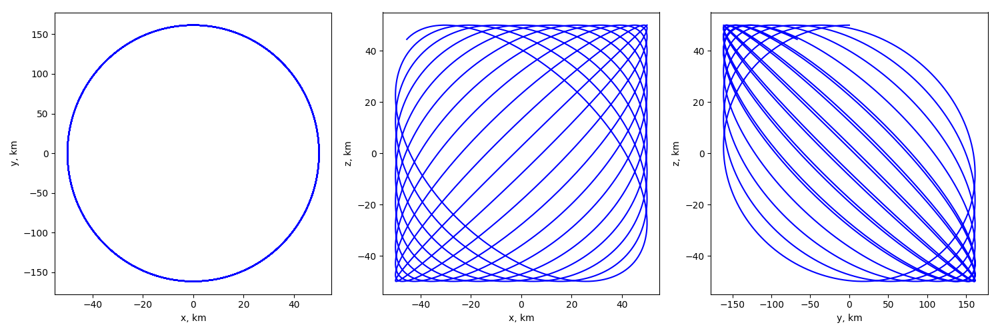

In [116]:
_=exp.calc_orb_with_p1(0.0012584403023051065, -0.0012590066089565295, True)

# 100

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


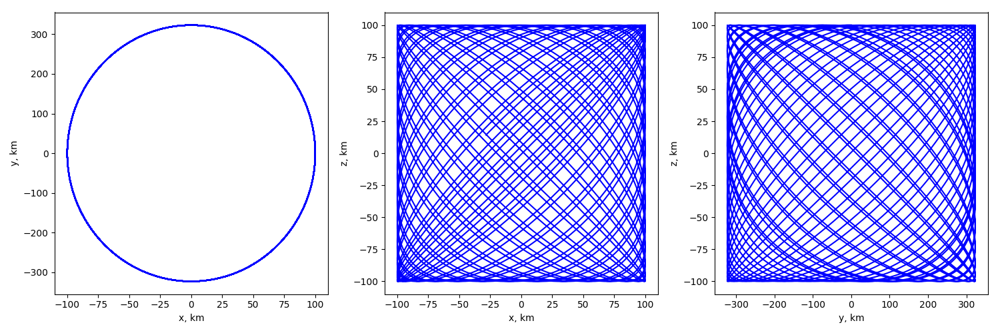

In [117]:
exp = Experiment(100/model.R,100/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


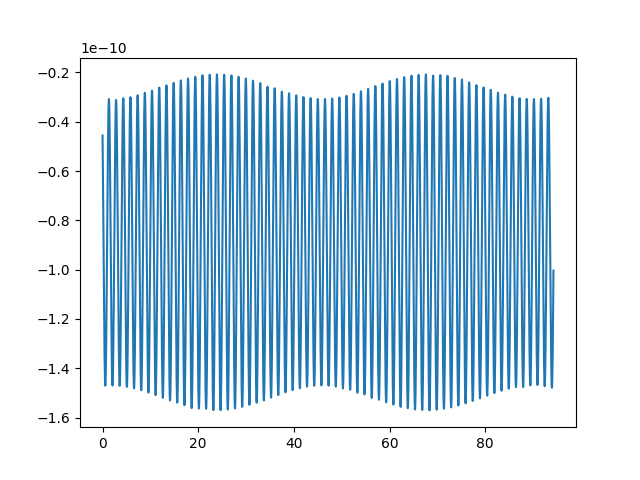

In [118]:
_ = exp.calc_h1_on_orb(True)

0.001258157148979301
-0.0012592897622823352


<IPython.core.display.Javascript object>


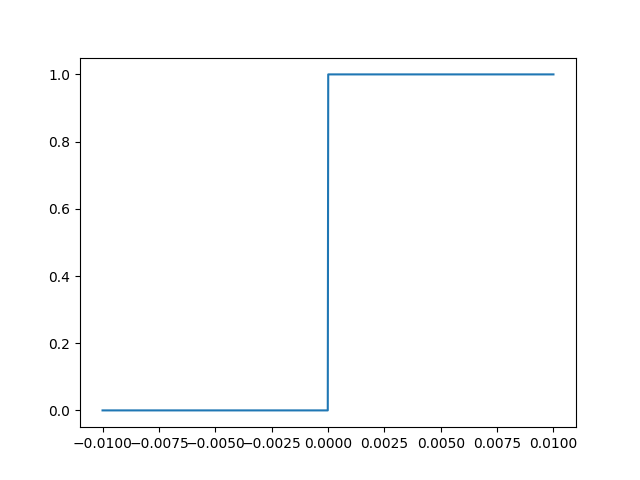

In [119]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


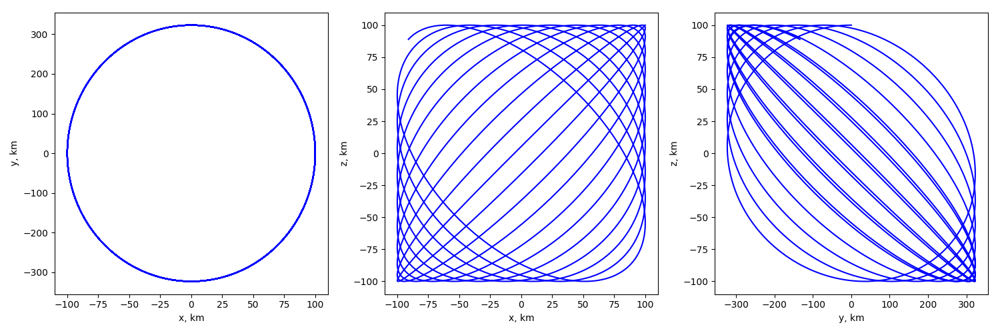

In [120]:
_=exp.calc_orb_with_p1(0.001258157148979301, -0.0012592897622823352, True)

# 200

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


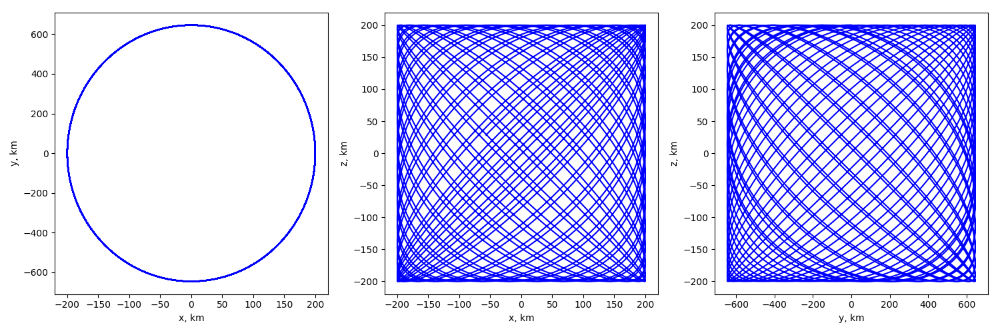

In [121]:
exp = Experiment(200/model.R,200/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


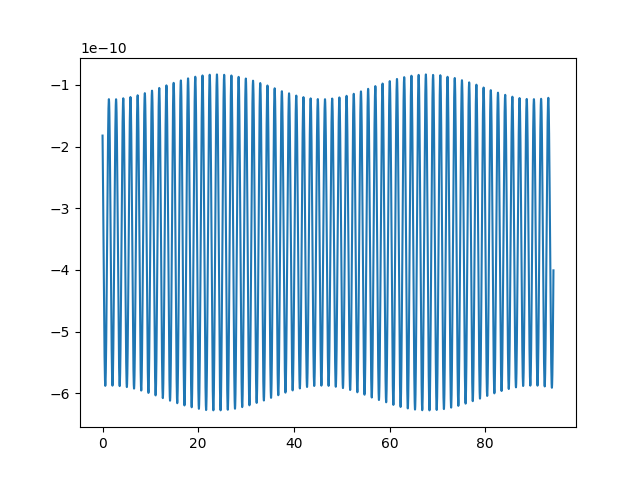

In [122]:
_ = exp.calc_h1_on_orb(True)

0.001257590842327784
-0.0012598560689338523


<IPython.core.display.Javascript object>


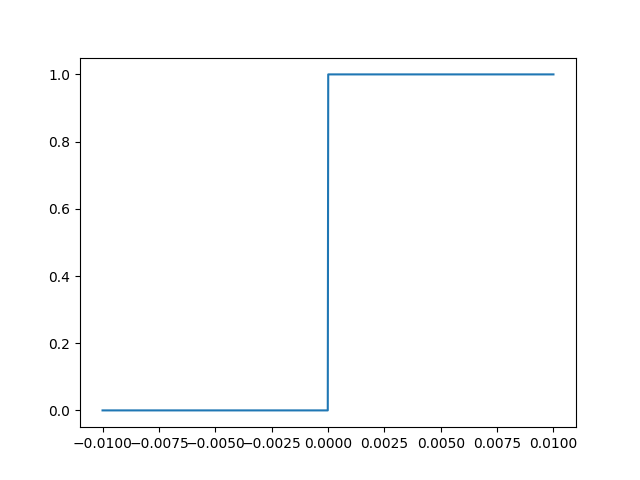

In [123]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


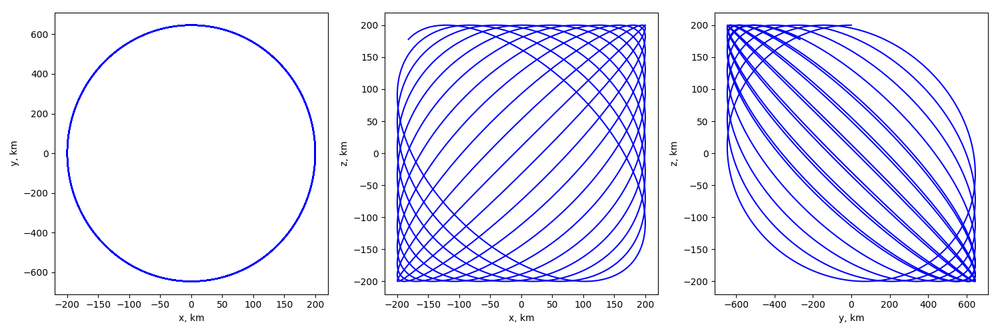

In [124]:
_=exp.calc_orb_with_p1(0.001257590842327784, -0.0012598560689338523, True)

# 1000

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


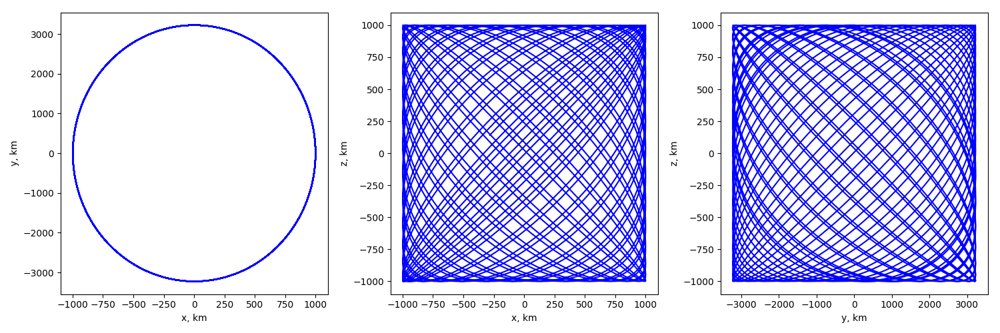

In [125]:
exp = Experimrnt(1000/model.R, 1000/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


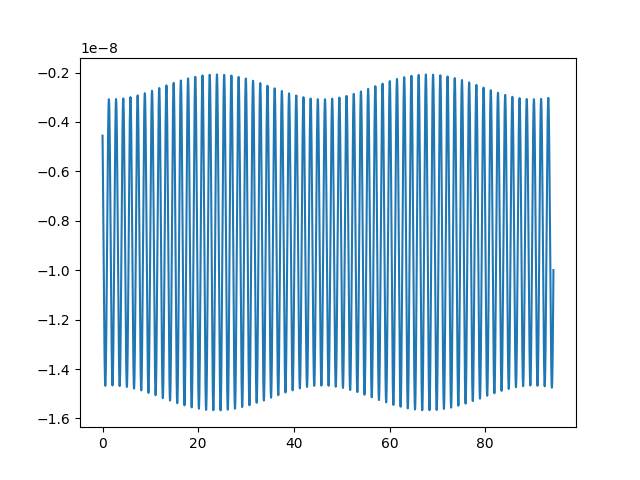

In [126]:
_ = exp.calc_h1_on_orb(True)

0.0012530603891158358
-0.0012643865221458005


<IPython.core.display.Javascript object>


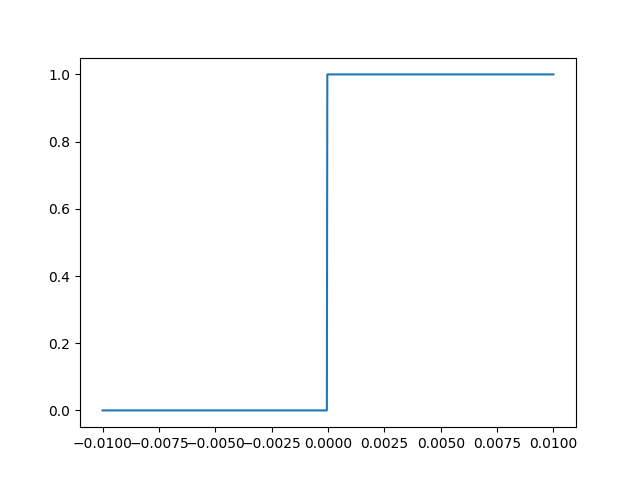

In [127]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


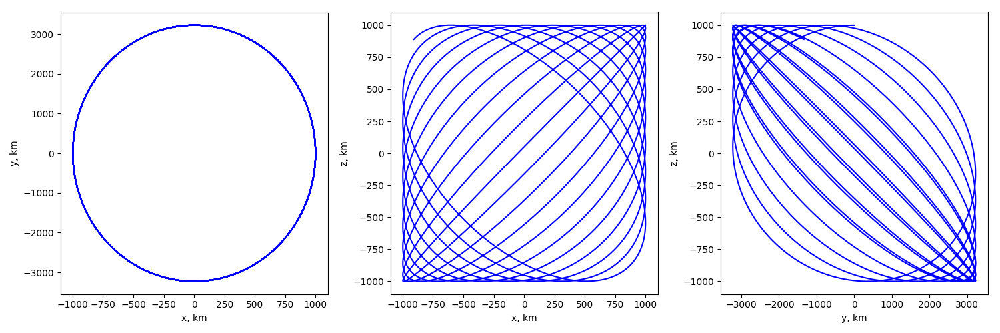

In [128]:
_=exp.calc_orb_with_p1(0.0012530603891158358, -0.0012643865221458005, True)

# 10000

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


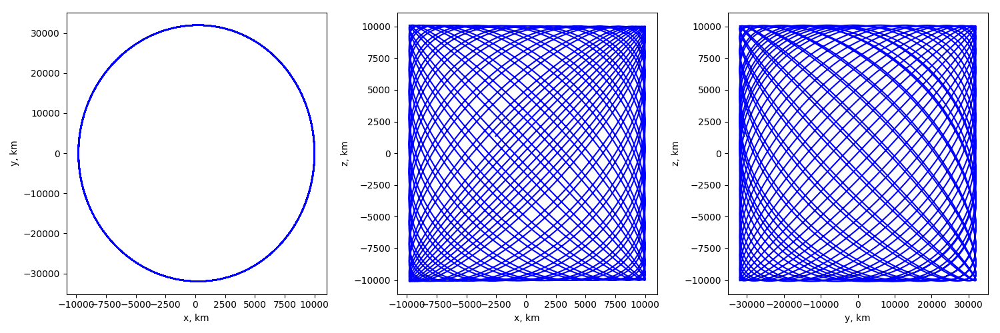

In [129]:
exp = Experiment(10000/model.R, 10000/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


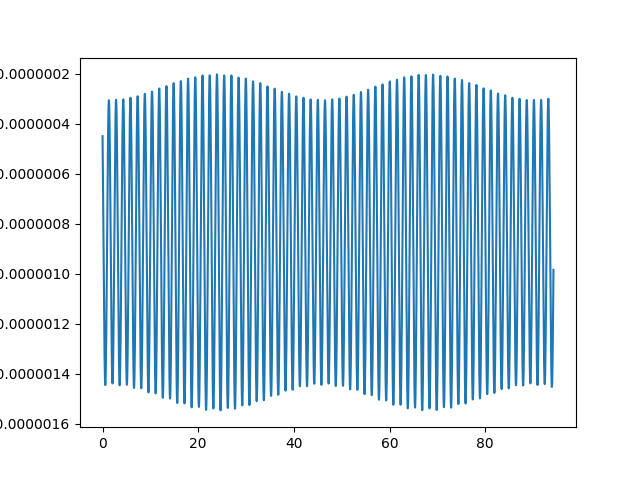

In [130]:
_ = exp.calc_h1_on_orb(True)

0.0012020927904808998
-0.0013153541207807365


<IPython.core.display.Javascript object>


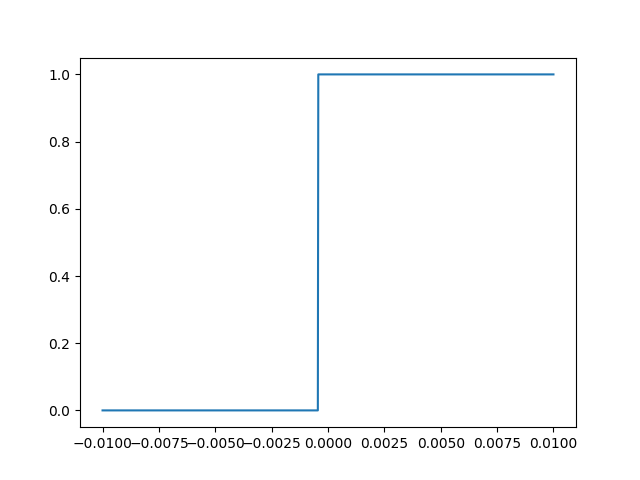

In [131]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


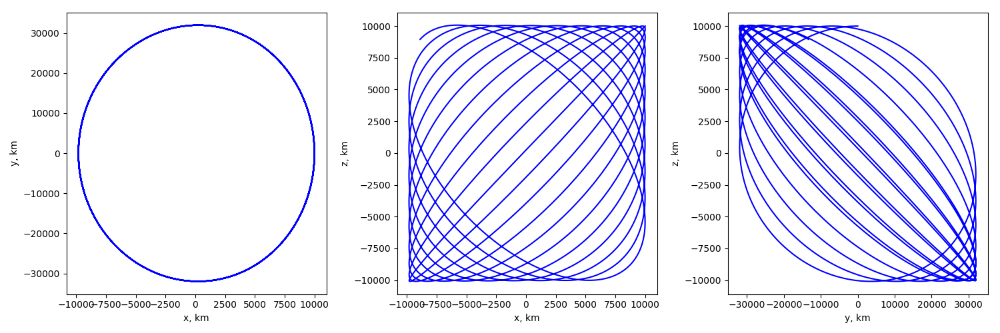

In [132]:
_=exp.calc_orb_with_p1(0.0012020927904808998, -0.0013153541207807365, True)

# 50000

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


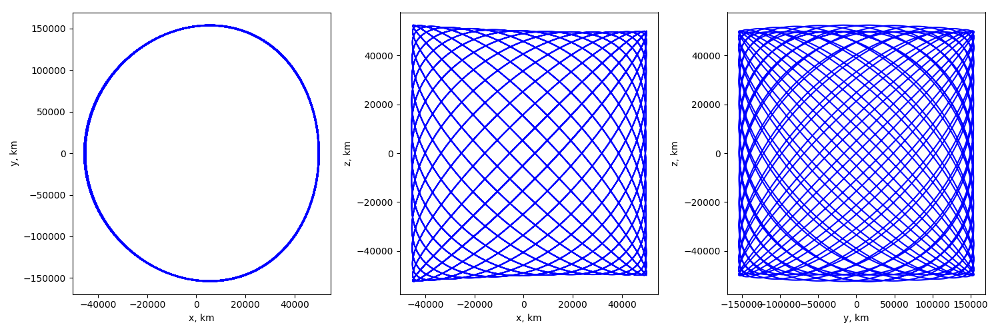

In [141]:
exp = Experiment(50000/model.R, 50000/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


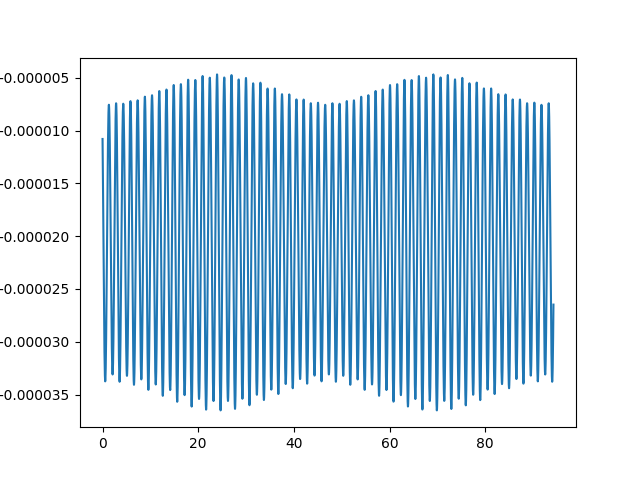

In [134]:
_ = exp.calc_h1_on_orb(True)

0.0009755701298814148
-0.0015418767813802213


<IPython.core.display.Javascript object>


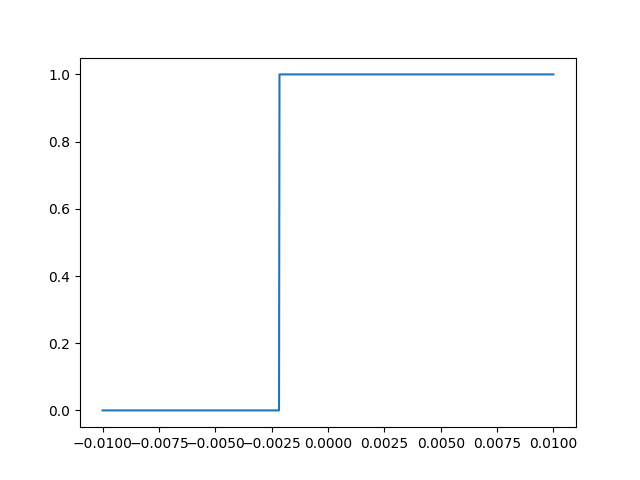

In [135]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


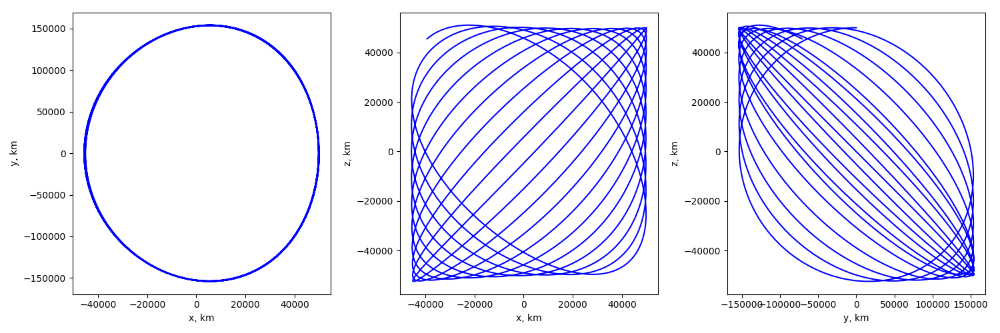

In [136]:
_=exp.calc_orb_with_p1(0.0009755701298814148, -0.0015418767813802213, True)

# 100000

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


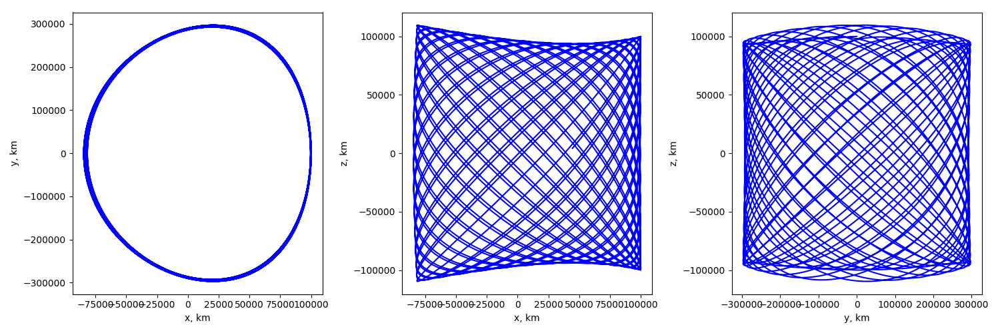

In [142]:
exp = Experiment(100000/model.R, 100000/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


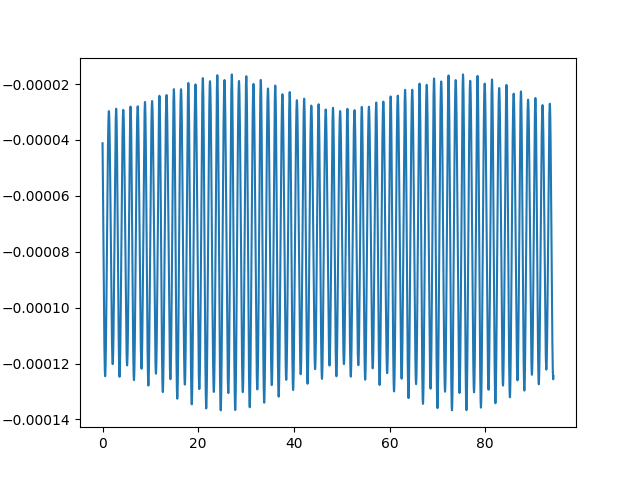

In [143]:
_ = exp.calc_h1_on_orb(True)

0.0006924168041321055
-0.0018250301071295306


<IPython.core.display.Javascript object>


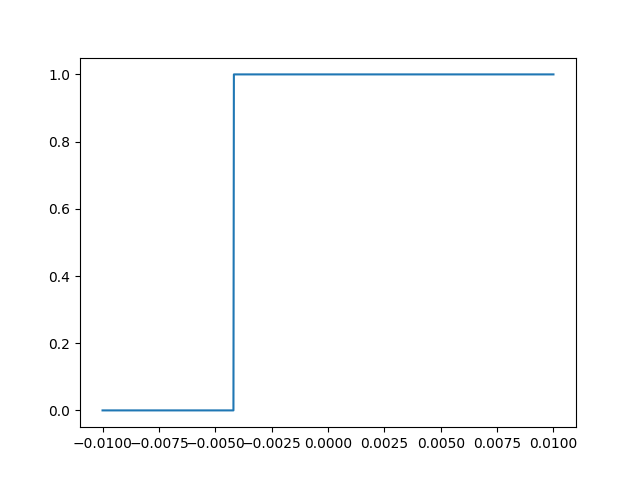

In [144]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 


<IPython.core.display.Javascript object>


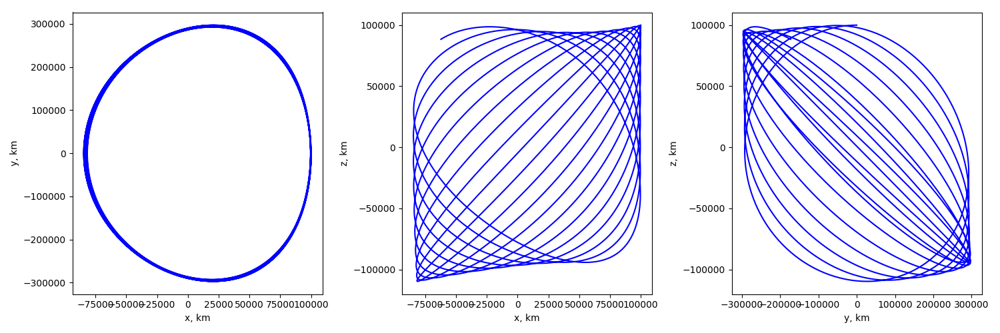

In [145]:
_=exp.calc_orb_with_p1(0.000692416804132105, -0.0018250301071295306, True)

# 200000

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


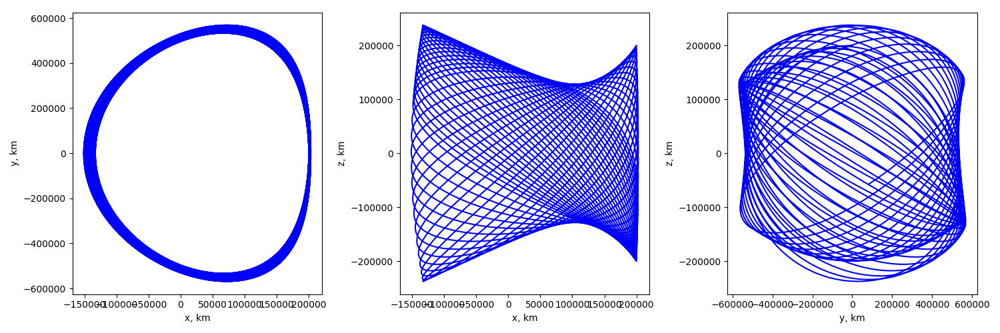

In [147]:
exp = Experiment(200000/model.R, 200000/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


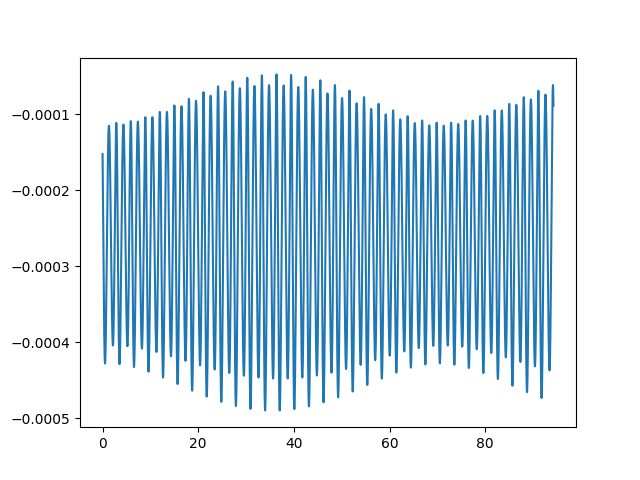

In [148]:
_ = exp.calc_h1_on_orb(True)

0.00012611015263329887
-0.002391336758628337


<IPython.core.display.Javascript object>


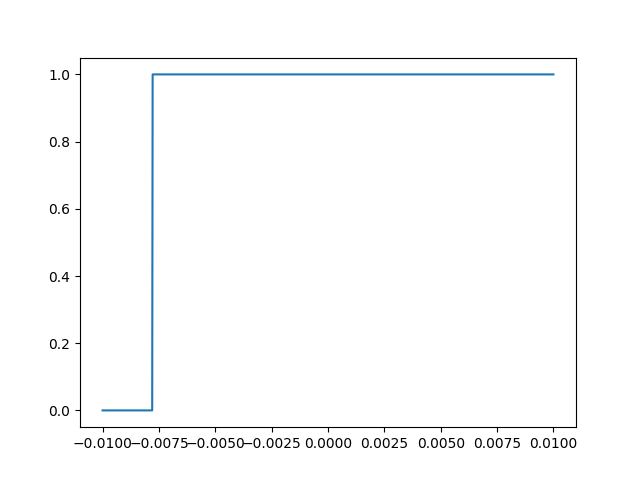

In [149]:
_ =exp.calc_final_pos(0.01)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


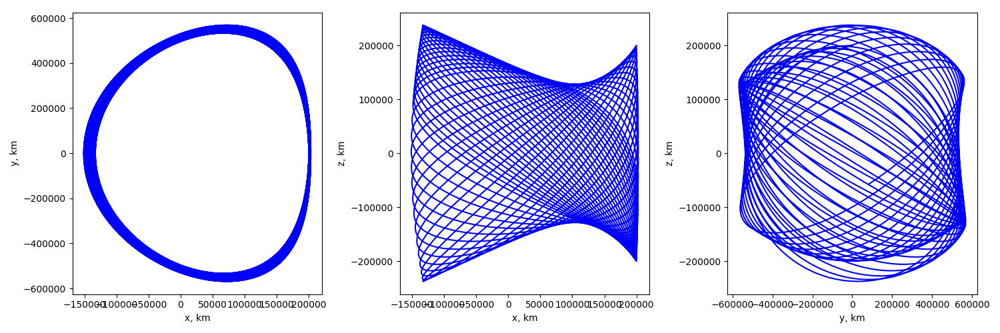

In [150]:
_=exp.calc_orb_with_p1(0.00012611015263329887, -0.002391336758628337, True)

# 500000

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


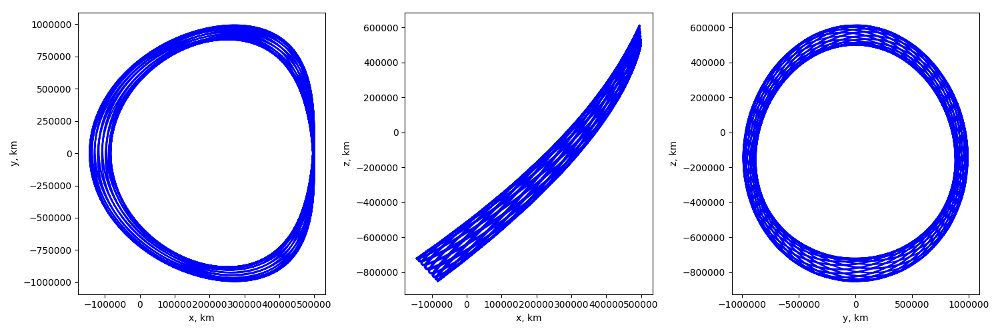

In [164]:
exp = Experiment(500000/model.R, 500000/model.R)
_ = exp.calc_orb(True)

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


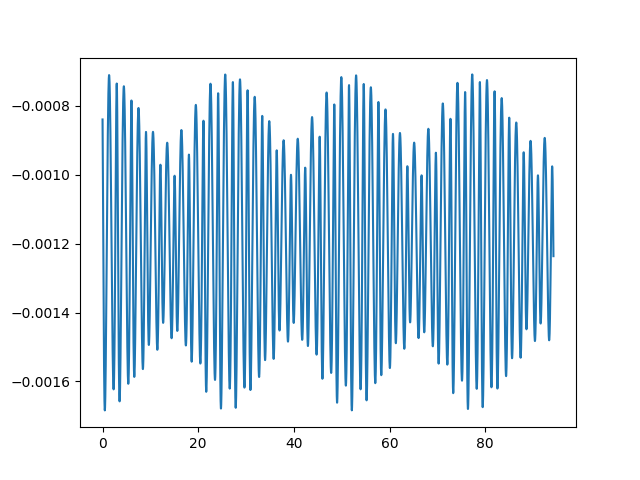

In [152]:
_ = exp.calc_h1_on_orb(True)

-0.00031534381222175594
-0.005347722702765747


<IPython.core.display.Javascript object>


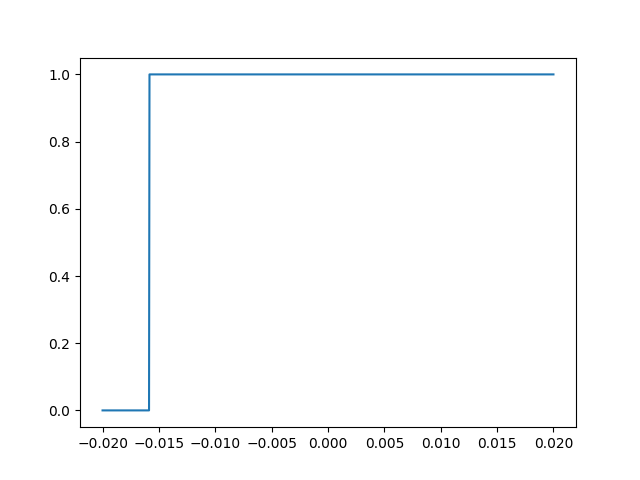

In [154]:
_ =exp.calc_final_pos(0.02)

In [157]:
s1=exp.calc_s0()
s1[4] = -0.015

Simple station-keeping: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 


<IPython.core.display.Javascript object>


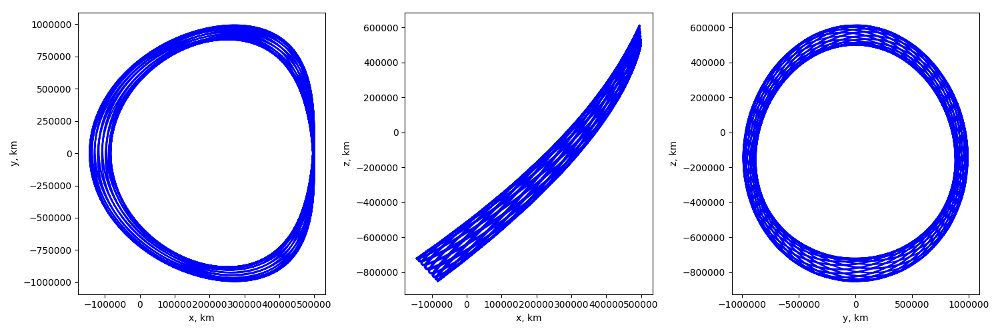

In [165]:
_=exp.calc_orb_with_p1(-0.00031534381222175594, -0.005347722702765747, plot=True, override_s0=s1)